<a href="https://colab.research.google.com/github/alhusari2/Capstone-ML/blob/experiment/scratch_modeling_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##import package

In [59]:
import pandas as pd
import numpy as np 
import itertools
import keras
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from keras.models import Sequential 
from keras import optimizers
from keras.preprocessing import image
from keras.layers import Dropout, Flatten, Dense  
from keras import applications  
from keras.utils.np_utils import to_categorical  
import matplotlib.pyplot as plt 
import matplotlib.image as mpimg
import math  
import datetime
import time
from keras.layers import LeakyReLU
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
import os
import tensorflow as tf

# print('Tensorflow_VER= V',tf.version.VERSION)
# print(confusion_matrix)

##Import dataset

In [60]:
# Mount Google Drive
#meninisialisasi drive
from google.colab import drive
drive.mount('/content/drive')
#set directory
train_data_dir = '/content/drive/MyDrive/machine learning/[1000]dataset VGG19 coba lagi/training'  
validation_data_dir = '/content/drive/MyDrive/machine learning/[1000]dataset VGG19 coba lagi/validation'
test_data_dir = '/content/drive/MyDrive/machine learning/[1000]dataset VGG19 coba lagi/test'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


##training and validation generator

In [61]:
#menginisialisasi variabel
batch_size = 8

In [62]:
def train_val_generators(TRAINING_DIR, VALIDATION_DIR,TEST_DIR):
  # Instantiate the ImageDataGenerator class 
  # Don't forget to normalize pixel values and set arguments to augment the images 
  train_datagen = ImageDataGenerator(rescale = 1./255.,
                                  zoom_range=0.2,
                                  horizontal_flip=True,
                                  vertical_flip=True)

  # Pass in the appropriate arguments to the flow_from_directory method
  train_generator = train_datagen.flow_from_directory(directory=TRAINING_DIR,
                                                      batch_size=batch_size, 
                                                      class_mode='categorical',
                                                      target_size=(300, 300))

  # Instantiate the ImageDataGenerator class (don't forget to set the rescale argument)
  # Remember that validation data should not be augmented
  validation_datagen = ImageDataGenerator(rescale = 1./255.)

  # Pass in the appropriate arguments to the flow_from_directory method
  validation_generator = validation_datagen.flow_from_directory(directory=VALIDATION_DIR,
                                                                batch_size=batch_size, 
                                                                target_size=(300, 300),
                                                                class_mode='categorical',  
                                                                shuffle=False)
  
  # Instantiate the ImageDataGenerator class 
  test_datagen = ImageDataGenerator(rescale = 1./255.)
  # Pass in the appropriate arguments to the flow_from_directory method
  test_generator = test_datagen.flow_from_directory(  
                    TEST_DIR,  
                    target_size=(300, 300),  
                    batch_size=batch_size,  
                    class_mode='categorical',  
                    shuffle=False)  

  return train_generator, validation_generator, test_generator

In [63]:
# Test the generators
train_generator, validation_generator, test_generator = train_val_generators(train_data_dir, validation_data_dir, test_data_dir)

Found 2100 images belonging to 3 classes.
Found 450 images belonging to 3 classes.
Found 450 images belonging to 3 classes.


In [64]:
num_classes = len(train_generator.class_indices)  
print(num_classes)

3


##model

In [65]:
model = tf.keras.models.Sequential([
    # Note the input shape is the desired size of the image 300x300 with 3 bytes color
    # This is the first convolution
    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(300, 300, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    # The second convolution
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The third convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The fourth convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The fifth convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # Flatten the results to feed into a DNN
    tf.keras.layers.Flatten(),
    # 512 neuron hidden layer
    tf.keras.layers.Dense(512, activation='relu'),
    # Only 1 output neuron. It will contain a value from 0-1 where 0 for 1 class ('horses') and 1 for the other ('humans')
    tf.keras.layers.Dense(3, activation='softmax')
])

model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 298, 298, 16)      448       
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 149, 149, 16)     0         
 g2D)                                                            
                                                                 
 conv2d_16 (Conv2D)          (None, 147, 147, 32)      4640      
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 73, 73, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_17 (Conv2D)          (None, 71, 71, 64)        18496     
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 35, 35, 64)      

In [66]:
# Set the training parameters
model.compile(optimizer = tf.keras.optimizers.Adam(),
              loss = 'categorical_crossentropy', 
              metrics = ['accuracy'])

In [69]:
class myCallback(tf.keras.callbacks.Callback):
        # Define the correct function signature for on_epoch_end
        def on_epoch_end(self, epoch, logs={}):
            if(logs.get('accuracy') > 0.95):                 
                print("\nReached 95% accuracy so cancelling training!")
                # Stop training once the above condition is met
                self.model.stop_training = True


##evaluate model

In [70]:
# Train the model.
callbacks = myCallback()
history = model.fit(train_generator, 
      epochs=20,
      batch_size=batch_size,  
      validation_data=validation_generator,
      verbose=1,
      callbacks=[callbacks])

Epoch 1/20
263/263 [==============================] - 821s 3s/step - loss: 0.6157 - accuracy: 0.7333 - val_loss: 0.5066 - val_accuracy: 0.7889
Epoch 2/20
263/263 [==============================] - 437s 2s/step - loss: 0.4931 - accuracy: 0.7867 - val_loss: 0.4552 - val_accuracy: 0.7933
Epoch 3/20
263/263 [==============================] - 440s 2s/step - loss: 0.3758 - accuracy: 0.8462 - val_loss: 0.3978 - val_accuracy: 0.8333
Epoch 4/20
263/263 [==============================] - 435s 2s/step - loss: 0.3041 - accuracy: 0.8695 - val_loss: 0.4661 - val_accuracy: 0.8200
Epoch 5/20
263/263 [==============================] - 419s 2s/step - loss: 0.2935 - accuracy: 0.8748 - val_loss: 0.2922 - val_accuracy: 0.8622
Epoch 6/20
263/263 [==============================] - 422s 2s/step - loss: 0.2791 - accuracy: 0.8895 - val_loss: 0.1839 - val_accuracy: 0.9267
Epoch 7/20
263/263 [==============================] - 420s 2s/step - loss: 0.2253 - accuracy: 0.9076 - val_loss: 0.1853 - val_accuracy: 0.9267

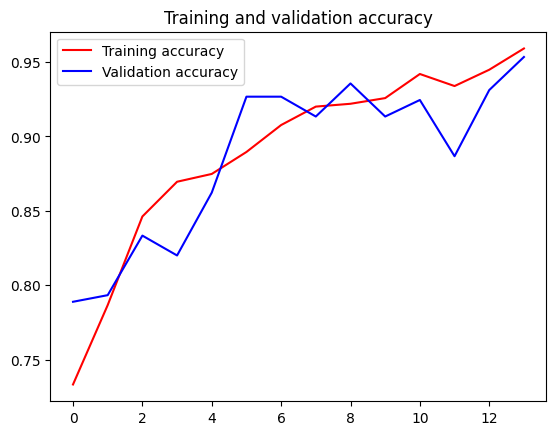

<Figure size 640x480 with 0 Axes>

In [71]:
import matplotlib.pyplot as plt

# Plot the results
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.show()

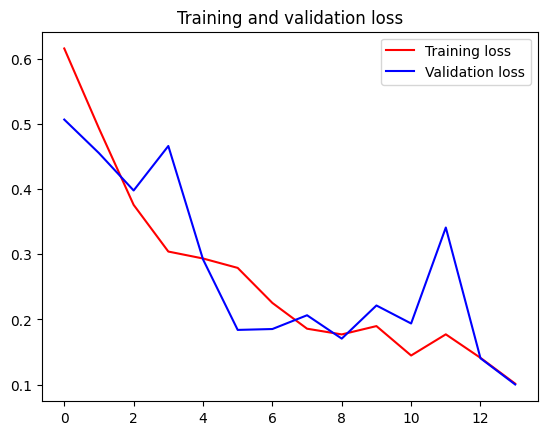

<Figure size 640x480 with 0 Axes>

In [72]:
import matplotlib.pyplot as plt

# Plot the results
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()

plt.show()

##evaluasi 

In [75]:
test_labels = test_generator.classes  
test_labels = to_categorical(test_labels, num_classes=num_classes)

In [96]:
preds = np.round(model.predict(test_generator),0) 
print('rounded test_labels', preds)

57/57 [==============================] - 58s 1s/step
rounded test_labels [[1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 ...
 [0. 0. 1.]
 [0. 0. 1.]
 [0. 0. 1.]]


In [80]:
# Mendapatkan daftar kelas berdasarkan nama subfolder di folder tersebut
view = os.listdir(test_data_dir)
print(view)

['jahe', 'kunyit', 'lengkuas']


In [81]:
classification_metrics = metrics.classification_report(test_labels, preds, target_names=view )
print(classification_metrics)

              precision    recall  f1-score   support

        jahe       0.95      0.97      0.96       150
      kunyit       0.97      0.95      0.96       150
    lengkuas       1.00      0.99      1.00       150

   micro avg       0.97      0.97      0.97       450
   macro avg       0.97      0.97      0.97       450
weighted avg       0.97      0.97      0.97       450
 samples avg       0.97      0.97      0.97       450



In [77]:
import numpy as np
from sklearn.metrics import confusion_matrix

# Mendapatkan prediksi dari model
y_pred = model.predict(test_generator)
y_pred = np.argmax(y_pred, axis=1)  # Mengambil indeks dengan nilai terbesar sebagai label prediksi

# Mendapatkan label sebenarnya
y_true = test_generator.classes

# Mencetak confusion matrix
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:")
print(cm)


57/57 [==============================] - 58s 1s/step
Confusion Matrix:
[[146   4   0]
 [  7 143   0]
 [  1   0 149]]


In [91]:
from sklearn.metrics import confusion_matrix

categorical_test_labels = pd.DataFrame(test_labels).idxmax(axis=1)
categorical_preds = pd.DataFrame(preds).idxmax(axis=1)
confusion_matrix= confusion_matrix(categorical_test_labels, categorical_preds)

Confusion matrix tanpa normalisasi 





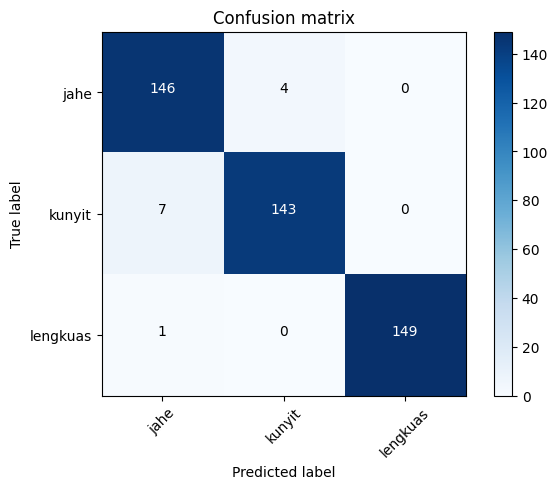

In [92]:
plot_confusion_matrix(confusion_matrix, view)  

##saving model

In [93]:
# model.save_weights('scratch_modeling_weight_4.h5')
model.save_weights('/content/drive/MyDrive/machine learning/scratch_modeling_weight_4.h5')
model.save('/content/drive/MyDrive/machine learning/model_scracth_jamuin.h5')

##testing 

In [100]:
def read_image(file_path):
    print("[INFO] loading and preprocessing image...")  
    image = load_img(file_path, target_size=(300, 300))  
    image = img_to_array(image)  
    image = np.expand_dims(image, axis=0)
    image /= 255.  
    return image

# use this to upload files
def upload():
  from google.colab import files
  uploaded = files.upload() 
  for name, data in uploaded.items():
    with open(name, 'wb') as f:
      f.write(data)
      print ('saved file', name)
      return name

def test_single_image(path):
    images = read_image(path)
    view = ['jahe', 'kunyit', 'lengkuas']
    time.sleep(.5)
    preds = model.predict(images)
    
    for idx, view, x in zip(range(len(view)), view , preds[0]):
        print("ID: {}, Label: {} {}%".format(idx, view, round(x*100,2) ))
    print('Tebakanya:')
    time.sleep(.5)

    return load_img(path)

Saving IMG20230522064724.jpg to IMG20230522064724.jpg
saved file IMG20230522064724.jpg
[INFO] loading and preprocessing image...
1/1 [==============================] - 0s 40ms/step
ID: 0, Label: jahe 73.66%
ID: 1, Label: kunyit 26.24%
ID: 2, Label: lengkuas 0.1%
Tebakanya:


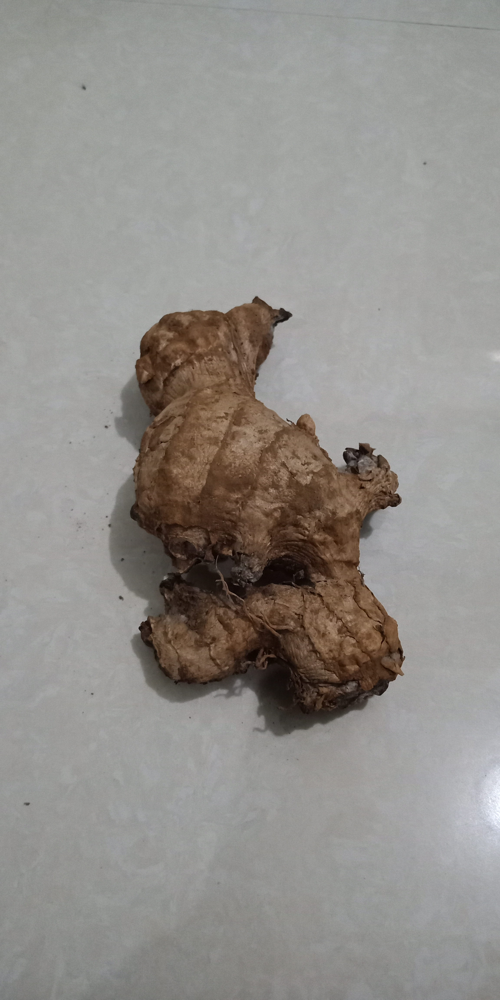

In [111]:
name = upload()
path = str(name)
test_single_image(path)